# 传达数据洞察

- V2更新内容<br>
- 更改了读取路径为同个文件夹内直接读取；<br>
- 更新了自己电脑的pandas版本，以可以正常使用dt.day_name()进行数据分析；<br>
- 安装了plotly_express并使用地图相关内容；<br>
- 修改了双变量图的探索；<br>
- 补充了每个图表的标题，结论；<br>
- 更新了PDF文档（1）Report，（2）ReadMe文件<br>

- 感谢审阅的老师！

 在本项目中，我选取了《摩拜单车上海用户数据集》，对摩拜单车的用户数据进行了一系列分析和探索，得出了一些关于用户行程和订单的结论。

### 数据分析部分

通过载入文件，对文件进行目测和编程分析，得到数据视觉化中需用到的深层信息

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
%matplotlib inline
import datetime
import plotly_express as px

/Users/ivy73/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
#根据第一次review的反馈，为了使用dt.day_name()，本次更新了pandas版本为最新版并在自己电脑上进行测试，更新的版本是1.1.1，测试成功
pd.__version__

'1.1.1'

In [3]:
#载入文件
df1 = pd.read_csv('mobike_shanghai_sample_updated.csv')

In [4]:
#了解文件内数据的基本信息
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 102361 entries, 0 to 102360
Data columns (total 10 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   orderid           102361 non-null  int64  
 1   bikeid            102361 non-null  int64  
 2   userid            102361 non-null  int64  
 3   start_time        102361 non-null  object 
 4   start_location_x  102361 non-null  float64
 5   start_location_y  102361 non-null  float64
 6   end_time          102361 non-null  object 
 7   end_location_x    102361 non-null  float64
 8   end_location_y    102361 non-null  float64
 9   track             102361 non-null  object 
dtypes: float64(4), int64(3), object(3)
memory usage: 7.8+ MB


In [5]:
#查看是否有重复条目
sum(df1.duplicated())

0

分离开始时间

In [6]:
#将start_time转换为时间日期格式，并将月份，日期进行分离，提取出这一天是星期几
df1['start_time'] = pd.to_datetime(df1['start_time'])

In [7]:
df1['start_month']=df1['start_time'].dt.month

In [8]:
df1['start_hour']=df1['start_time'].dt.hour

In [9]:
df1['start_day_of_week']=df1['start_time'].dt.day_name()

分离结束时间，执行与上面相同的操作

In [10]:
df1['end_time'] = pd.to_datetime(df1['end_time'])

In [11]:
df1['end_month']=df1['end_time'].dt.month

In [12]:
df1['end_hour']=df1['end_time'].dt.hour

In [13]:
#检查结果
df1.head()

,orderid,bikeid,userid,start_time,start_location_x,start_location_y,end_time,end_location_x,end_location_y,track,start_month,start_hour,start_day_of_week,end_month,end_hour
0,78387,158357,10080,2016-08-20 06:57:00,121.348,31.389,2016-08-20 07:04:00,121.357,31.388,"121.347,31.392#121.348,31.389#121.349,31.390#1...",8,6,Saturday,8,7
1,891333,92776,6605,2016-08-29 19:09:00,121.508,31.279,2016-08-29 19:31:00,121.489,31.271,"121.489,31.270#121.489,31.271#121.490,31.270#1...",8,19,Monday,8,19
2,1106623,152045,8876,2016-08-13 16:17:00,121.383,31.254,2016-08-13 16:36:00,121.405,31.248,"121.381,31.251#121.382,31.251#121.382,31.252#1...",8,16,Saturday,8,16
3,1389484,196259,10648,2016-08-23 21:34:00,121.484,31.320,2016-08-23 21:43:00,121.471,31.325,"121.471,31.325#121.472,31.325#121.473,31.324#1...",8,21,Tuesday,8,21
4,188537,78208,11735,2016-08-16 07:32:00,121.407,31.292,2016-08-16 07:41:00,121.418,31.288,"121.407,31.291#121.407,31.292#121.408,31.291#1...",8,7,Tuesday,8,7


计算出每个行程持续的时长

In [14]:
#将end_time与start_time相减，以分钟为单位
df1['duration_min'] = (df1['end_time']-df1['start_time']).dt.seconds/60

In [15]:
#检查结果
df1['duration_min'].head()

0     7.0
1    22.0
2    19.0
3     9.0
4     9.0
Name: duration_min, dtype: float64

In [16]:
df1['duration_min'].value_counts()

7.0       7087
6.0       6840
8.0       6724
5.0       5996
9.0       5979
          ... 
329.0        1
1408.0       1
273.0        1
157.0        1
573.0        1
Name: duration_min, Length: 297, dtype: int64

统计星期几产生的订单最多呢？

In [17]:
#周末（Saturday & Sunday）竟然没有排进前三名
df1.start_day_of_week.value_counts()

Wednesday    17829
Monday       16380
Tuesday      16259
Saturday     13359
Friday       13208
Sunday       12842
Thursday     12484
Name: start_day_of_week, dtype: int64

将出发和目的地的经纬度进行拼接，为可视化做准备

In [18]:
df1.start_location_x = df1.start_location_x.astype(str)

In [19]:
df1.start_location_y = df1.start_location_y.astype(str)

In [20]:
df1.end_location_x = df1.end_location_x.astype(str)

In [21]:
df1.end_location_y = df1.end_location_y.astype(str)

In [22]:
df1['start_location'] = df1['start_location_x'].str.cat(df1['start_location_y'],sep=',')

In [23]:
df1['end_location'] = df1['end_location_x'].str.cat(df1['end_location_y'],sep=',')

## 可视化探索 Part1-单变量探索

### 探索1：本数据集中，星期几产生的订单最多呢？

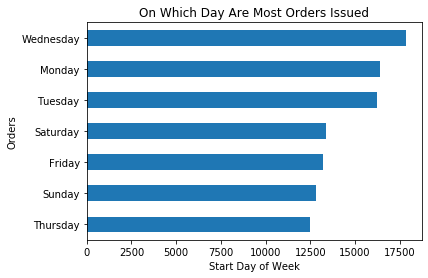

In [24]:
# 计算订单量
plt.title('On Which Day Are Most Orders Issued')
plt.xlabel('Start Day of Week')
plt.ylabel('Orders')
df1.start_day_of_week.value_counts().sort_values().plot(kind='barh');

##### 结论：产生订单最多的是星期三

### 探索2：行程持续时长一般是多少？

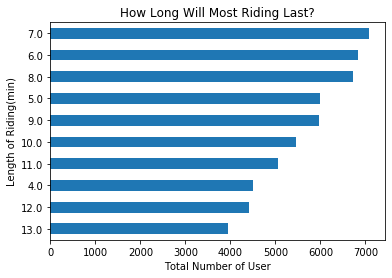

In [25]:
# 持续时长的探索
plt.title('How Long Will Most Riding Last?')
plt.xlabel('Total Number of User')
plt.ylabel('Length of Riding(min)')
df1.duration_min.value_counts().iloc[0:10].sort_values().plot(kind='barh');

##### 结论：可以看出，7分钟的行程最多，绝大部分骑行集中在5到10分钟之内

## 可视化探索 Part2-双变量探索

### 探索3：一个星期里的某一天中是否存在某个时长的行程比较突出，不同于其他日子的情况？

In [26]:
#因为上面统计中，大部分行程都在10分钟以内，所以这里稍稍扩大范围，取到30分钟来制作小提琴图进行观察
df_short_duration = df1[df1['duration_min']<30]

Text(0, 0.5, 'The Duration of Riding (min)')

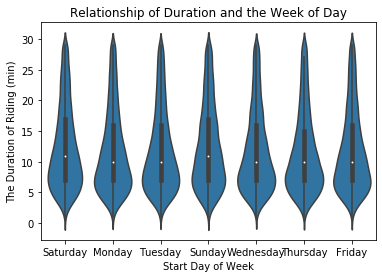

In [27]:
#使用小提琴图探索星期几和行程时长之间的关系
sb.violinplot(data=df_short_duration,x='start_day_of_week',y='duration_min',color=sb.color_palette()[0]);
plt.title('Relationship of Duration and the Week of Day');
plt.xlabel('Start Day of Week')
plt.ylabel('The Duration of Riding (min)')

##### 结论：不存在这种情况，每天的行程时间都是类似的，集中在5至10分钟之内

## 可视化探索 Part3-多变量探索

### 探索4：对于坐标的探索：主要的出发地集中在哪里呢？

根据第一版审阅反馈，尝试使用了plotly_express（第一次接触px感觉好神奇，顺便又复习了一下group()和size()，啊，要学的还有太多了）

In [28]:
# 计算每个 start location 的数量，并合并到原数据集中（又学会了一个计算数量的方法）
df_count = df1.groupby(['start_location']).size().rename('start_location_count').reset_index()
df1 = df1.merge(df_count,on='start_location',how='left')

In [29]:
df1.head()

,orderid,bikeid,userid,start_time,start_location_x,start_location_y,end_time,end_location_x,end_location_y,track,start_month,start_hour,start_day_of_week,end_month,end_hour,duration_min,start_location,end_location,start_location_count
0,78387,158357,10080,2016-08-20 06:57:00,121.348,31.389,2016-08-20 07:04:00,121.357,31.388,"121.347,31.392#121.348,31.389#121.349,31.390#1...",8,6,Saturday,8,7,7.0,"121.348,31.389","121.357,31.388",1
1,891333,92776,6605,2016-08-29 19:09:00,121.508,31.279,2016-08-29 19:31:00,121.489,31.271,"121.489,31.270#121.489,31.271#121.490,31.270#1...",8,19,Monday,8,19,22.0,"121.508,31.279","121.489,31.271",16
2,1106623,152045,8876,2016-08-13 16:17:00,121.383,31.254,2016-08-13 16:36:00,121.405,31.248,"121.381,31.251#121.382,31.251#121.382,31.252#1...",8,16,Saturday,8,16,19.0,"121.383,31.254","121.405,31.248",6
3,1389484,196259,10648,2016-08-23 21:34:00,121.484,31.32,2016-08-23 21:43:00,121.471,31.325,"121.471,31.325#121.472,31.325#121.473,31.324#1...",8,21,Tuesday,8,21,9.0,"121.484,31.32","121.471,31.325",94
4,188537,78208,11735,2016-08-16 07:32:00,121.407,31.292,2016-08-16 07:41:00,121.418,31.288,"121.407,31.291#121.407,31.292#121.408,31.291#1...",8,7,Tuesday,8,7,9.0,"121.407,31.292","121.418,31.288",7


In [35]:
# 设定地图的中心坐标(这里试着运行了这段代码，发现做出这2个地图后页面有点卡顿)
center = {'lat':31.25, 'lon':121.4}
# 绘制气泡图
px.scatter_mapbox(df1, lat='start_location_y', lon='start_location_x', zoom=10, center = center, size='start_location_count', opacity=0.1, mapbox_style='open-street-map')

In [31]:
# 绘制热图
px.density_mapbox(df1, lat='start_location_y', lon='start_location_x', z='start_location_count', radius=10, center=center, zoom=10, mapbox_style="open-street-map")

##### 结论：出发点从地图上看，主要集中在东经121.5度，北纬31.2度这一带，在上海市杨浦区较为密集，主要分布在杨浦，黄埔，静安区等，浦东很少，且呈放射状向西北和西南方向分布。